In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from helpers.plot_helpers import *
from helpers.computational_tools import remesh, select_LatLon, Lk_error, x_coord, y_coord
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cmocean
import os
%load_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings("ignore")
import hvplot.xarray
import hvplot
hvplot.output(widget_location='bottom')

In [530]:
bare = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2_dt/bare/output/ocean.stats.merged.nc', decode_times=False)

In [531]:
smooth = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2_dt/Smooth/output/ocean.stats.nc', decode_times=False)

In [532]:
reynolds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2_dt/Reynolds/output/ocean.stats.nc', decode_times=False)

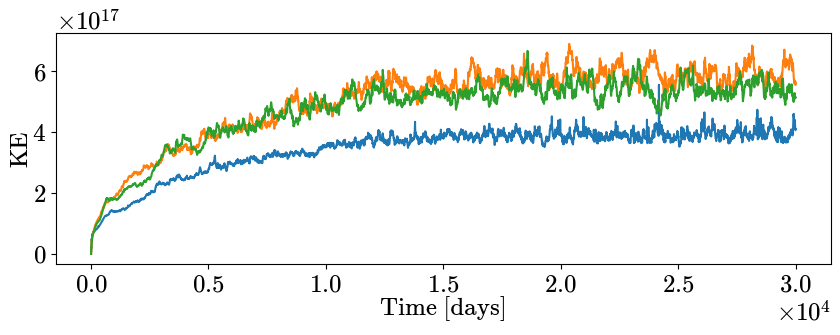

In [536]:
plt.figure(figsize=(10,3))
bare.KE.sum('Layer').plot()
smooth.KE.sum('Layer').plot()
reynolds.KE.sum('Layer').plot()

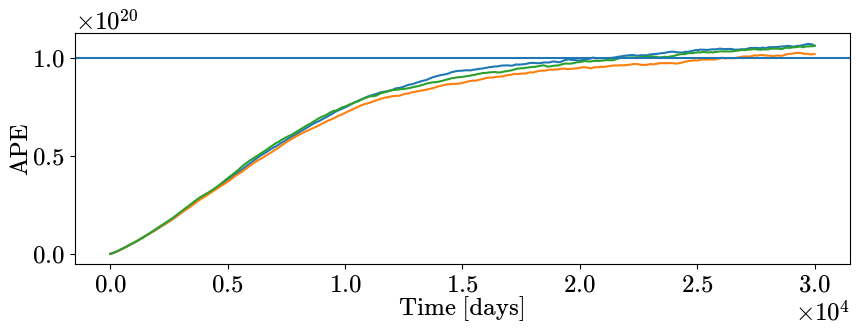

In [539]:
plt.figure(figsize=(10,3))
bare.APE.sum('Interface').plot()
smooth.APE.sum('Interface').plot()
reynolds.APE.sum('Interface').plot()
plt.axhline(y=1e+20)

In [488]:
# rey_klower = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-Scheme/Reynolds-2.5-Klower/output/ocean.stats.nc', decode_times=False)

In [482]:
# rey_alias = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-Scheme/Reynolds-2.5-no-aliasing/output/ocean.stats.nc', decode_times=False)

In [499]:
# rey = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-Scheme/Reynolds-1.8/output/ocean.stats.nc', decode_times=False)

Text(0.5, 1.0, 'Dealiasing of input \ngradients does not \nhelp much')

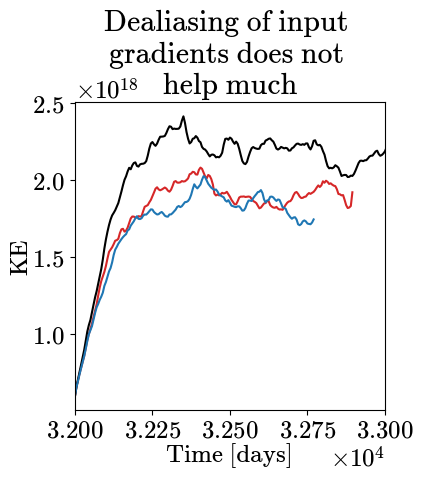

In [504]:
rey_alias.KE.sum('Layer').plot(color='tab:red')
rey_klower.KE.sum('Layer').plot(color='k')
rey.KE.sum('Layer').plot(color='tab:blue')
plt.xlim([32000,33000])
plt.title('Dealiasing of input \ngradients does not \nhelp much')

In [ ]:
rey_alias.KE.sum('Layer').plot()

In [472]:
# plt.figure(figsize=(10,3))
# plt.subplot(1,2,1)
# bare.KE.sum('Layer').plot()
# smooth.KE.sum('Layer').plot()
# reynolds.KE.sum('Layer').plot()
# plt.ylim([0,3e+18])
# plt.subplot(1,2,2)
# bare.APE.sum('Interface').plot()
# smooth.APE.sum('Interface').plot()
# reynolds.APE.sum('Interface').plot()

In [7]:
vert_grid = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/INPUT/coordinate.nc')
static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/static.nc', decode_times=False)

In [12]:
xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2/R2/output/Vertical_coordinate.nc').g.values

array([1.0e+01, 2.1e-03, 3.9e-03, 5.4e-03, 5.8e-03, 5.8e-03, 5.7e-03,
       5.3e-03, 4.8e-03, 4.2e-03, 3.7e-03, 3.1e-03, 2.4e-03, 1.7e-03,
       1.1e-03])

In [16]:
rho = vert_grid.Layer.values

In [22]:
(rho[1:]-rho[:-1])/1000*10 - xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2/R2/output/Vertical_coordinate.nc').g.values[1:]

array([ 0.00000000e+00,  4.33680869e-19,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -4.33680869e-19,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00])

# Accuracy of functions computing KE and APE

In [2]:
def KE_joul(ds, static):
    u = ds.u
    v = ds.v
    h = ds.h
    R = 1000. # It is reference density
    area_t = static.area_t
    return (0.5 * R * (remesh(u**2, h) + remesh(v**2, h)) * h * area_t).sum(dim=('xh','yh', 'zl'))

In [3]:
vert_grid = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/INPUT/coordinate.nc')
static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/static.nc', decode_times=False)
lores = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/snapshots*', decode_times=False, chunks={'time': 1})
lores_stats = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/ocean.stats.merged.nc', decode_times=False)

In [17]:
KE = KE_joul(lores, static).compute()

In [18]:
KE_true = lores_stats.KE.sum('Layer').rename({'Time':'time'})

Text(0.5, 1.0, 'KE Prediction\n error')

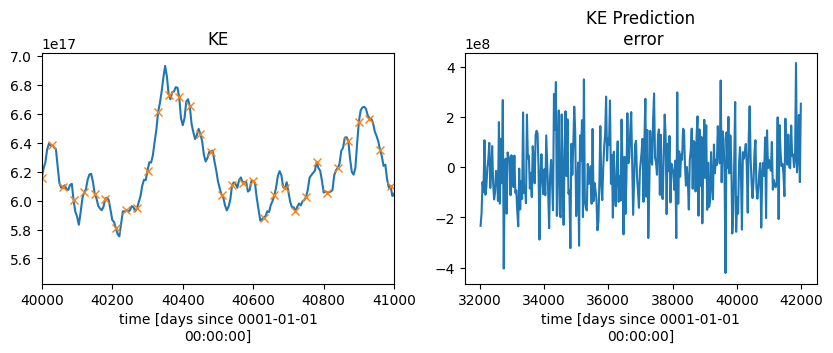

In [19]:
plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
KE_true.plot(ls='-')
KE.plot(ls='', marker='x')
plt.xlim([40000,41000])
plt.title('KE')
plt.subplot(1,2,2)
(KE - KE_true.interp(time=KE.time)).plot()
plt.title('KE Prediction\n error')

In [9]:
interface_rest = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2/R2/output/MOM_IC.nc').eta.min(['lath','lonh']).squeeze().rename({'Interface': 'zi'}).drop_vars('zi')
print(interface_rest.values)
print(len(interface_rest), len(lores.zi))

[    0.   -25.   -75.  -175.  -300.  -450.  -625.  -825. -1050. -1300.
 -1600. -1950. -2350. -2850. -3400. -4000.]
16 16


In [10]:
g = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2/R2/output/Vertical_coordinate.nc').drop_vars('Layer').g.rename({'Layer': 'zi'})
g = xr.concat([g, xr.DataArray([0], dims='zi')], dim='zi') # Potential energy in the bottom layer is zero
print(len(g), g.values)

16 [1.0e+01 2.1e-03 3.9e-03 5.4e-03 5.8e-03 5.8e-03 5.7e-03 5.3e-03 4.8e-03
 4.2e-03 3.7e-03 3.1e-03 2.4e-03 1.7e-03 1.1e-03 0.0e+00]


In [44]:
def APE_joul(interface, static, eta_above_topography=False, sum=True, bottom='interface'):

    interface_rest = xr.DataArray([    0.,   -25.,   -75.,  -175.,  -300.,  -450.,  -625.,  -825.,
       -1050., -1300., -1600., -1950., -2350., -2850., -3400., -4000.], dims='zi')
    g = xr.DataArray([1.0e+01, 2.1e-03, 3.9e-03, 5.4e-03, 5.8e-03, 5.8e-03, 5.7e-03,
       5.3e-03, 4.8e-03, 4.2e-03, 3.7e-03, 3.1e-03, 2.4e-03, 1.7e-03,
       1.1e-03, 0.0e+00], dims='zi')
    
    R = 1000. # Reference density
    area_t = static.area_t
    if bottom == 'interface':
        coordinate_of_bottom = interface.isel(zi=-1, time=0).drop_vars(['time', 'zi'])
    elif bottom == 'static':
        coordinate_of_bottom = - static.depth_ocean
    else:
        print('Error: wrong bottom parameter')
    
    if eta_above_topography:
        interface = np.maximum(interface, coordinate_of_bottom)
    hint = interface - interface_rest
    
    # Where bottom is upper than the rest interface
    hbot = np.maximum(coordinate_of_bottom - interface_rest,0)
    
    APE_instant = (0.5 * R * g * (hint**2) * area_t)
    APE_constant = (0.5 * R * g * (hbot**2) * area_t)
    if sum:
        return (APE_instant - APE_constant).sum(['zi', 'xh', 'yh'])
    else:
        return (APE_instant - APE_constant)

In [52]:
def APE_Elizabeth(interface, static, sum=True):
    interface_ref = - xr.DataArray([    0.,   -25.,   -75.,  -175.,  -300.,  -450.,  -625.,  -825.,
       -1050., -1300., -1600., -1950., -2350., -2850., -3400.], dims='zi')
    drho = xr.DataArray([1.0226e+03, 2.1000e-01, 3.9000e-01, 5.4000e-01, 5.8000e-01,
       5.8000e-01, 5.7000e-01, 5.3000e-01, 4.8000e-01, 4.2000e-01,
       3.7000e-01, 3.1000e-01, 2.4000e-01, 1.7000e-01, 1.1000e-01], dims='zi')
    
    depth = static.depth_ocean
    area_t = static.area_t
    
    correction = (interface_ref-depth);
    correction = correction.where(correction>0.0).fillna(0)
    
    interface_ref_HIC = interface_ref - correction

    eta2 = (interface.isel(zi=slice(None,-1))+interface_ref_HIC)**2
    
    APE_net=(0.5*10*drho*eta2*area_t)
    if sum:
        return APE_net.sum(['zi', 'xh', 'yh'])
    else:
        return APE_net

In [88]:
def h_to_e(h, e, static):
    depth = static.depth_ocean
    
    eta = e * 0
    
    for zl in range(len(h.zl)):
        eta[{'zi': zl}] = h.isel(zl=slice(zl,None)).sum('zl')
    eta = eta - depth
    
    return eta

In [2]:
def e_to_h(e, h):
    thickness = h * 0
    
    for zl in range(len(h.zl)):
        thickness[{'zl':zl}] = e.isel(zi=zl)-e.isel(zi=zl+1)
    
    return thickness

In [90]:
e = lores.e.sel(time=slice(41000,None))
h = lores.h.sel(time=slice(41000,None))
e_my = h_to_e(h, e, static)
h_my = e_to_h(e, h)

In [91]:
((((e - e_my)**2).mean() / (e**2).mean())**(1/2)).values

array(6.61430215e-08)

In [92]:
((((h - h_my)**2).mean() / (h**2).mean())**(1/2)).values

array(2.145919e-14, dtype=float32)

In [53]:
APE = APE_joul(e, static).compute()

In [63]:
APE_static = APE_joul(e, static, bottom='static').compute()

In [64]:
APE_above = APE_joul(e, static, eta_above_topography=True).compute()

In [65]:
APE_h = APE_joul(h_to_e(h,e,static), static).compute()

In [66]:
APE_el = APE_Elizabeth(e, static).compute()

In [67]:
APE_true = lores_stats.APE.sum('Interface').rename({'Time':'time'}).sel(time=slice(41000,None))

(0.0, 1.2e+20)

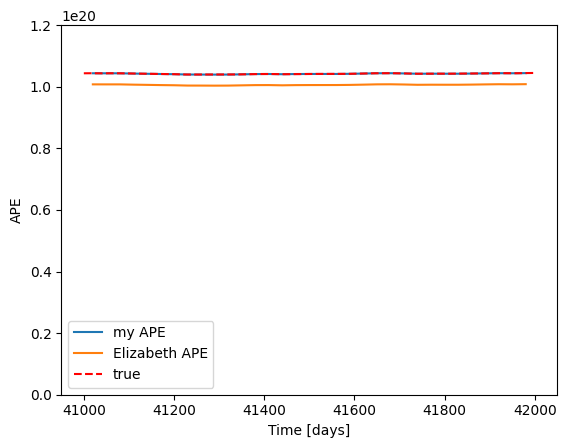

In [68]:
APE.plot(label='my APE')
APE_el.plot(label='Elizabeth APE')
#APE_above.plot(label='eta above', ls=':', lw=2)
APE_true.plot(label='true', ls='--', color='r')
plt.legend()
plt.ylim([0,1.2e+20])

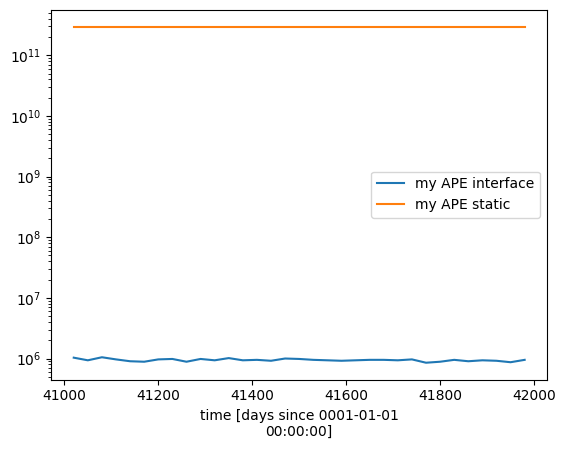

In [70]:
(APE-APE_true.interp(time=APE.time)).plot(label='my APE interface')
(APE_static-APE_true.interp(time=APE.time)).plot(label='my APE static')
#(APE_el-APE_true.interp(time=APE.time)).plot(label='Elizabeth APE')
#(APE_above-APE_true.interp(time=APE.time)).plot(label='eta above')
plt.title('')
plt.legend()
plt.yscale('log')
#plt.ylim([0,None])

In [318]:
print(APE_true.mean().values)
print(APE.mean().values)
print(APE_above.mean().values)
print(APE_h.mean().values)
print(APE_el.mean().values)

1.0420468517699256e+20
1.0420156448788164e+20
1.0420156475323335e+20
1.0420156414390675e+20
1.0060999703283968e+20


# Very simple APE

In [82]:
def APE_joul_simple(eta, static, form=0):

    interface_rest = xr.DataArray([    0.,   -25.,   -75.,  -175.,  -300.,  -450.,  -625.,  -825.,
       -1050., -1300., -1600., -1950., -2350., -2850., -3400., -4000.], dims='zi')
    g = xr.DataArray([1.0e+01, 2.1e-03, 3.9e-03, 5.4e-03, 5.8e-03, 5.8e-03, 5.7e-03,
       5.3e-03, 4.8e-03, 4.2e-03, 3.7e-03, 3.1e-03, 2.4e-03, 1.7e-03,
       1.1e-03, 0.0e+00], dims='zi')
    
    R = 1000. # Reference density
    bottom = eta.isel(zi=-1, time=0).drop_vars(['time', 'zi'])
    
    eta_rest = np.maximum(bottom, interface_rest)
    
    if form == 0:
        APE = 0.5 * R * g * (eta-eta_rest)**2
    elif form == 1:
        APE = 0.5 * R * g * (eta**2 - eta_rest**2)
    else:
        print('Run')
    
    return (APE*static.area_t).sum(['zi', 'xh', 'yh'])

In [89]:
e = lores.e.isel(time=slice(-10,None))
APE_old = APE_joul(e,static).compute()
APE_new_form0 = APE_joul_simple(e,static, form=0).compute()
APE_new_form1 = APE_joul_simple(e,static, form=1).compute()
APE_true = lores_stats.APE.sum('Interface').rename({'Time':'time'}).interp(time=APE_old.time)

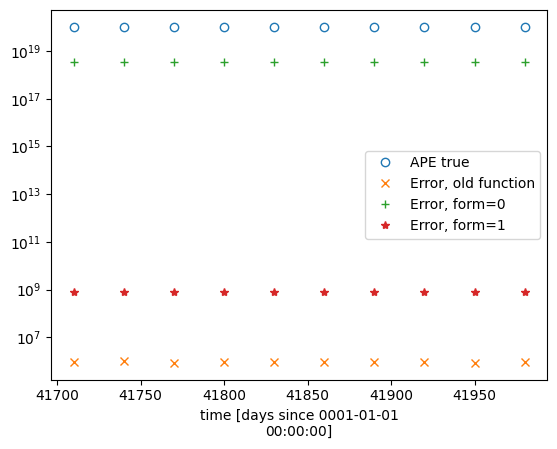

In [91]:
APE_true.plot(marker='o', ls='', markerfacecolor='none', label='APE true')
np.abs(APE_true-APE_old).plot(marker='x', ls='', label='Error, old function')
np.abs(APE_true-APE_new_form0).plot(marker='+', ls='', label='Error, form=0')
np.abs(APE_true-APE_new_form1).plot(marker='*', ls='', label='Error, form=1')
plt.yscale('log')
plt.legend()

# Coarsegraining 1/32 experiment

In [228]:
from dask.diagnostics import ProgressBar

In [229]:
#R32 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/snapshots*', decode_times=False, chunks={'zi':1, 'zl':1, 'time':1})
R32 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/longmean*', decode_times=False, chunks={'zi':1, 'zl':1, 'time':1})
lores = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/snapshots*', decode_times=False, chunks={'time': 1})

In [76]:
#R32_subsample = R32.isel(time=slice(None,None,6))

In [160]:
R32f = xr.Dataset() # coarsegrained experiment

In [161]:
for key in ['u', 'v', 'h', 'e']:
    R32f[key] = remesh(R32[key], lores[key], fillna=False)

In [79]:
#R32f['time'] = lores.time[-4:None]

In [162]:
with ProgressBar():
    R32f_compute = R32f.compute()

[########################################] | 100% Completed |  2min  1.2s


In [164]:
R32f_filtered = filter_dataset(R32f_compute, R4_static, FGR=4)

In [165]:
R32f_filtered.to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/R4_longmean_FGR4.nc')

# Energy of coarsened 1/32 experiment

In [282]:
lores = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/snapshots*', decode_times=False, chunks={'time': 1})

In [283]:
R32_R4 = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/R4_snapshots.nc', decode_times=False)
R32_R2 = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/R2_snapshots.nc', decode_times=False)

In [284]:
R32_stats = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/ocean_stats.nc', decode_times=False)

In [285]:
R4_static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/static.nc', decode_times=False)
R2_static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2/R2/output/static.nc', decode_times=False)

In [286]:
# KE in 1/32 model
print(R32_stats.KE.sum('Layer').sel(Time=slice(2705,None)).mean().values)

# APE in 1/32 model
print(R32_stats.APE.sum('Interface').sel(Time=slice(2705,None)).mean().values)

2.4430274344295875e+18
9.585034307590157e+19


In [287]:
KE_R4 = KE_joul(R32_R4, R4_static)
print(KE_R4.values.mean())

2.322297312273691e+18


In [288]:
KE_R2 = KE_joul(R32_R2, R2_static)
print(KE_R2.values.mean())

2.089584441348888e+18


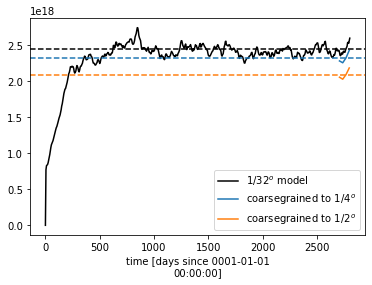

In [289]:
R32_stats.KE.sum('Layer').plot(label='$1/32^o$ model', color='k')
KE_R4.plot(label='coarsegrained to $1/4^o$')
KE_R2.plot(label='coarsegrained to $1/2^o$')
plt.legend()
plt.axhline(y=2.4430274344295875e+18, color='k', ls='--')
plt.axhline(y=2.322297312273691e+18, color='tab:blue', ls='--')
plt.axhline(y=2.089584441348888e+18, color='tab:orange', ls='--')

In [290]:
APE_R4 = APE_joul(R32_R4.e, R4_static).compute()
print(APE_R4.values.mean())

9.539993955862908e+19


In [291]:
APE_R2 = APE_joul(R32_R2.e, R2_static)
print(APE_R2.values.mean())

9.238019922514179e+19


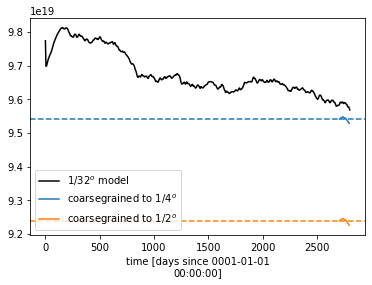

In [292]:
R32_stats.APE.sum('Interface').plot(label='$1/32^o$ model', color='k')
APE_R4.plot(label='coarsegrained to $1/4^o$')
APE_R2.plot(label='coarsegrained to $1/2^o$')
plt.legend()
plt.axhline(y=9.539993955862818e+19, color='tab:blue', ls='--')
plt.axhline(y=9.238019922514115e+19, color='tab:orange', ls='--')

# Energy of filtered fields

In [293]:
import gcm_filters
def filter_dataset(ds, static, FGR=4):
    if FGR == 0:
        return ds
    filter_simple_fixed_factor_t = gcm_filters.Filter(
        filter_scale=FGR,
        dx_min=1,
        filter_shape=gcm_filters.FilterShape.GAUSSIAN,
        grid_type=gcm_filters.GridType.REGULAR_WITH_LAND_AREA_WEIGHTED,
        grid_vars={'area': static.area_t, 'wet_mask': static.wet}
    )

    filter_simple_fixed_factor_u = gcm_filters.Filter(
        filter_scale=FGR,
        dx_min=1,
        filter_shape=gcm_filters.FilterShape.GAUSSIAN,
        grid_type=gcm_filters.GridType.REGULAR_WITH_LAND_AREA_WEIGHTED,
        grid_vars={'area': static.area_u, 'wet_mask': static.wet_u}
    )

    filter_simple_fixed_factor_v = gcm_filters.Filter(
        filter_scale=FGR,
        dx_min=1,
        filter_shape=gcm_filters.FilterShape.GAUSSIAN,
        grid_type=gcm_filters.GridType.REGULAR_WITH_LAND_AREA_WEIGHTED,
        grid_vars={'area': static.area_v, 'wet_mask': static.wet_v}
    )
    
    dsf = xr.Dataset()
    dsf['e'] = filter_simple_fixed_factor_t.apply(ds.e.copy(), dims=['yh', 'xh'])
    dsf['h'] = filter_simple_fixed_factor_t.apply(ds.h.copy(), dims=['yh', 'xh'])
    dsf['u'] = filter_simple_fixed_factor_u.apply(ds.u.copy(), dims=['yh', 'xq'])
    dsf['v'] = filter_simple_fixed_factor_v.apply(ds.v.copy(), dims=['yq', 'xh'])
    return dsf.compute()

# My initial KE/APE values

In [294]:
for dataset, static, mesh in zip([R32_R4, R32_R2], [R4_static, R2_static], ['1/4', '1/2']):
    print('')
    for FGR in [0,2,2.5,3,3.5,4.0]:
        import gcm_filters
        dsf = filter_dataset(dataset, static, FGR=FGR)
        KE = KE_joul(dsf, static)
        APE = APE_joul(dsf.e, static)
        print(f'Simulation=1/32, Coarse Grid={mesh}, FGR={FGR}, KE={KE.values.mean()}, APE={APE.values.mean()}')


Simulation=1/32, Coarse Grid=1/4, FGR=0, KE=2.322297312273691e+18, APE=9.539993955862908e+19
Simulation=1/32, Coarse Grid=1/4, FGR=2, KE=2.1450272228907116e+18, APE=9.352459974472981e+19
Simulation=1/32, Coarse Grid=1/4, FGR=2.5, KE=2.0676055307172598e+18, APE=9.26138288685096e+19
Simulation=1/32, Coarse Grid=1/4, FGR=3, KE=1.9773639817328172e+18, APE=9.145895075513213e+19
Simulation=1/32, Coarse Grid=1/4, FGR=3.5, KE=1.892035324579673e+18, APE=9.03107709184681e+19
Simulation=1/32, Coarse Grid=1/4, FGR=4.0, KE=1.7958262525974036e+18, APE=8.890104828700525e+19

Simulation=1/32, Coarse Grid=1/2, FGR=0, KE=2.089584441348888e+18, APE=9.238019922514179e+19
Simulation=1/32, Coarse Grid=1/2, FGR=2, KE=1.6997775271965916e+18, APE=8.644580895712208e+19
Simulation=1/32, Coarse Grid=1/2, FGR=2.5, KE=1.545957268187399e+18, APE=8.374243158216452e+19
Simulation=1/32, Coarse Grid=1/2, FGR=3, KE=1.3825360773307054e+18, APE=8.048178813856422e+19
Simulation=1/32, Coarse Grid=1/2, FGR=3.5, KE=1.23733791

# Elizabeth values

In [296]:
for dataset, static, mesh in zip([R32_R4, R32_R2], [R4_static, R2_static], ['1/4', '1/2']):
    print('')
    for FGR in [0]:
        import gcm_filters
        dsf = filter_dataset(dataset, static, FGR=FGR)
        KE = KE_joul(dsf, static)
        APE = APE_Elizabeth(h_to_e(dsf.h,dsf.e,static), static)
        print(f'Simulation=1/32, Coarse Grid={mesh}, FGR={FGR}, KE={KE.values.mean()}, APE={APE.values.mean()}')


Simulation=1/32, Coarse Grid=1/4, FGR=0, KE=2.322297312273691e+18, APE=9.463602416286928e+19

Simulation=1/32, Coarse Grid=1/2, FGR=0, KE=2.089584441348888e+18, APE=1.3077464821278815e+20


# My method but with interface diagnosed from thickness

In [298]:
for dataset, static, mesh in zip([R32_R4, R32_R2], [R4_static, R2_static], ['1/4', '1/2']):
    print('')
    for FGR in [0,2,2.5,3,3.5,4.0]:
        import gcm_filters
        dsf = filter_dataset(dataset, static, FGR=FGR)
        KE = KE_joul(dsf, static)
        APE = APE_joul(h_to_e(dsf.h,dsf.e,static), static)
        print(f'Simulation=1/32, Coarse Grid={mesh}, FGR={FGR}, KE={KE.values.mean()}, APE={APE.values.mean()}')


Simulation=1/32, Coarse Grid=1/4, FGR=0, KE=2.322297312273691e+18, APE=9.823498582638563e+19
Simulation=1/32, Coarse Grid=1/4, FGR=2, KE=2.1450272228907116e+18, APE=1.2977992125976914e+20
Simulation=1/32, Coarse Grid=1/4, FGR=2.5, KE=2.0676055307172598e+18, APE=1.598413015846326e+20
Simulation=1/32, Coarse Grid=1/4, FGR=3, KE=1.9773639817328172e+18, APE=2.117461385339415e+20
Simulation=1/32, Coarse Grid=1/4, FGR=3.5, KE=1.892035324579673e+18, APE=2.8046039730143553e+20
Simulation=1/32, Coarse Grid=1/4, FGR=4.0, KE=1.7958262525974036e+18, APE=3.867496664753847e+20

Simulation=1/32, Coarse Grid=1/2, FGR=0, KE=2.089584441348888e+18, APE=1.3382841318259719e+20
Simulation=1/32, Coarse Grid=1/2, FGR=2, KE=1.6997775271965916e+18, APE=4.808828909019527e+20
Simulation=1/32, Coarse Grid=1/2, FGR=2.5, KE=1.545957268187399e+18, APE=7.89157398430888e+20
Simulation=1/32, Coarse Grid=1/2, FGR=3, KE=1.3825360773307054e+18, APE=1.2843751311242263e+21
Simulation=1/32, Coarse Grid=1/2, FGR=3.5, KE=1.237

# Some checks of filtering

In [20]:
R4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/snapshots*.nc', decode_times=False, chunks={'zi':1, 'time':1, 'zi':1}).isel(time=slice(-5,None))#.isel(time=slice(None,None,6))
R4_static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/static.nc', decode_times=False)
interface_rest = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2/R2/output/MOM_IC.nc').eta.min(['lath','lonh']).squeeze().rename({'Interface': 'zi'}).drop_vars('zi')
g = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R2/R2/output/Vertical_coordinate.nc').drop_vars('Layer').g.rename({'Layer': 'zi'})
g = xr.concat([g, xr.DataArray([0], dims='zi')], dim='zi') # Potential energy in the bottom layer is zero

In [52]:
import gcm_filters
def filter_eta(e, static, FGR=32, simple=True):
    '''
    Filtering of eta with no-flux boundary conditions
    allow to conserve its integral, i.e.
    int(eta_k,dxdy)
    Consequently, int(eta_k-eta_k+1,dxdy) is also conserved
    and volume between interfaces does not change
    
    Here we move the Neumann B.C. to the points where interface
    intersects with topography
    '''
    ef = e * 0
    topography = - static.depth_ocean
    for t in range(e.shape[0]):
        for z in range(e.shape[1]):
            if simple:
                mask = static.wet
            else:
                mask = ((e[t,z] > topography).astype('int') * static.wet)
            filter_simple_fixed_factor_t = gcm_filters.Filter(
                filter_scale=FGR,
                dx_min=1,
                filter_shape=gcm_filters.FilterShape.GAUSSIAN,
                grid_type=gcm_filters.GridType.REGULAR_WITH_LAND_AREA_WEIGHTED,
                grid_vars={'area': static.area_t, 'wet_mask': mask}
            )
            ef[t,z] = filter_simple_fixed_factor_t.apply(e[t,z], dims=['yh', 'xh'])
    return ef

In [56]:
import gcm_filters
def filter_h(h, static, FGR=32):
    filter_simple_fixed_factor_t = gcm_filters.Filter(
        filter_scale=FGR,
        dx_min=1,
        filter_shape=gcm_filters.FilterShape.GAUSSIAN,
        grid_type=gcm_filters.GridType.REGULAR_WITH_LAND_AREA_WEIGHTED,
        grid_vars={'area': static.area_t, 'wet_mask': static.wet}
    )
    return filter_simple_fixed_factor_t.apply(h, dims=['yh', 'xh'])

In [53]:
e_4 = R4.e
e_4f_simple = filter_eta(e_4, R4_static,simple=True)
e_4f_bottom = filter_eta(e_4, R4_static,simple=False)

In [58]:
h_4 = R4.h
h_4f = filter_h(h_4, R4_static)

In [47]:
e_4.hvplot(x='xh', y='yh', width=300, height=600) + \
e_4f_simple.hvplot(x='xh', y='yh', width=300, height=600, label='Mask = wet') + \
e_4f_bottom.hvplot(x='xh', y='yh', width=300, height=600, label='Mask = wet * (eta > bottom)')

:Layout
   .DynamicMap.I   :DynamicMap   [zi,time]
      :Image   [xh,yh]   (e)
   .DynamicMap.II  :DynamicMap   [zi,time]
      :Image   [xh,yh]   (e)
   .DynamicMap.III :DynamicMap   [zi,time]
      :Image   [xh,yh]   (e)

# Mean fields analysis

In [177]:
ssh_R32 = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/R4_longmean_FGR4.nc', decode_times=False).e.isel(zi=0).mean('time')
ssh_R4 = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/longmean_00041050.nc', decode_times=False).e.isel(zi=0).mean('time')
ssh_smooth = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-Scheme/Smooth-2.5-Klower-dt/output/longmean_00041050.nc', decode_times=False).e.isel(zi=0).mean('time')
ssh_reynolds = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-Scheme/Reynolds-2.5-Klower-dt/output/longmean_00041050.nc', decode_times=False).e.isel(zi=0).mean('time')

In [180]:
def plot_ssh(ssh, target=None, show_error=False):
    if show_error is False or (ssh == target).all():
        im = ssh.plot.contourf(levels=np.arange(-4,4.25,0.25), add_colorbar=False)
        ssh.plot.contour(levels=np.arange(-4,4.25,0.25), colors='k')
    else:
        error = ssh - target
        im = error.plot.contourf(levels=np.arange(-1,1.1,0.1), add_colorbar=False, cmap='bwr', extend='both')
        RMSE = float((error**2).mean())
        plt.text(2,0, f'RMSE={round(RMSE,4)} $m$')
    
    plt.xlabel('Longitude')
    plt.xticks(np.arange(10,70,20))
    plt.title('')
    plt.ylabel('')

    return im

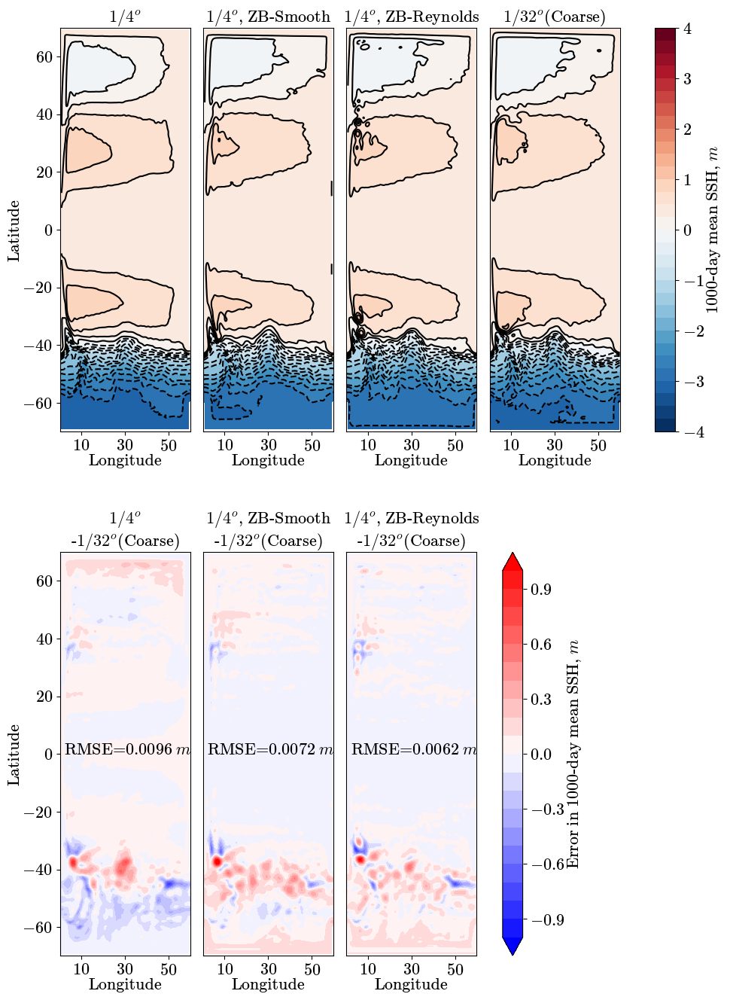

In [183]:
default_rcParams({'axes.formatter.limits': (-5,5), 'figure.subplot.wspace': 0.1, 'figure.subplot.hspace': 0.3, 'font.size': 16})
fig,ax = plt.subplots(2,4,figsize=(12,16))
labels = ['$1/4^o$', '$1/4^o$, ZB-Smooth', '$1/4^o$, ZB-Reynolds', '$1/32^o$(Coarse)']

for col,exp in enumerate([ssh_R4, ssh_smooth, ssh_reynolds, ssh_R32]):
    plt.sca(ax[0][col])
    im = plot_ssh(exp, ssh_R32)
    plt.title(labels[col], fontsize=16)
    if col == 0:
        plt.ylabel('Latitude')
    else:
        plt.yticks([])
        
    if col < 3:
        plt.sca(ax[1][col])
        im_er = plot_ssh(exp, ssh_R32, show_error=True)
        
        if col == 0:
            plt.ylabel('Latitude')
        else:
            plt.yticks([])

        plt.title(f'{labels[col]}\n-{labels[-1]}', fontsize=16)

ax[1][3].remove()
plt.colorbar(im, ax = ax[0][:], label='1000-day mean SSH, $m$')
plt.colorbar(im_er, ax = ax[1][:3], label='Error in 1000-day mean SSH, $m$')
plt.savefig('NW2_error_SSH.png', dpi=200)

# Drake Passage

In [21]:
M4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/bare/output/longmean_00029050.nc', decode_times=False).mean('time')
M4_smooth = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Smooth-filter-3D/output/longmean_00029050.nc', decode_times=False).mean('time')
M4_reynolds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Reynolds-newest-code/output/longmean_00029050.nc', decode_times=False).mean('time')
M32 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/longmean*.nc', decode_times=False)

In [22]:
e32 = M32.e.isel(xh=0).mean('time').compute()
e4 = M4.e.isel(xh=0).compute()
e4_smooth = M4_smooth.e.isel(xh=0).compute()
e4_reynolds = M4_reynolds.e.isel(xh=0).compute()

In [23]:
def plot_interfaces_Drake(e, label='$1/4^o$', target=e32):
    for zi in range(15):
        target.isel(zi=zi).plot(ls='-', color='k', lw=1)
        e.isel(zi=zi).plot(ls='--', color='b', lw=1)
    e4.isel(zi=-1).plot(color='k') # show bathymetry 
    lats = [-60, -50, -40]
    plt.xticks(lats, [f'${-j}$' for j in lats], rotation=0)
    plt.xlim([-61,-39])
    plt.xlabel('Latitude ($^o$ S)')
    plt.yticks(np.arange(-4000,1000,1000), np.arange(4000,-1000,-1000))
    plt.ylabel('Depth ($m$)')
    plt.title('')
    
    # Layer number
    xoff = {2:-42,5:-45,7:-48,9:-50,11:-51,13:-52}
    for k,x in xoff.items():
        plt.text( x, e32.sel(yh=x,method='nearest')[k:k+2].mean(), '%i'%(k+1), verticalalignment='center', fontsize=10)


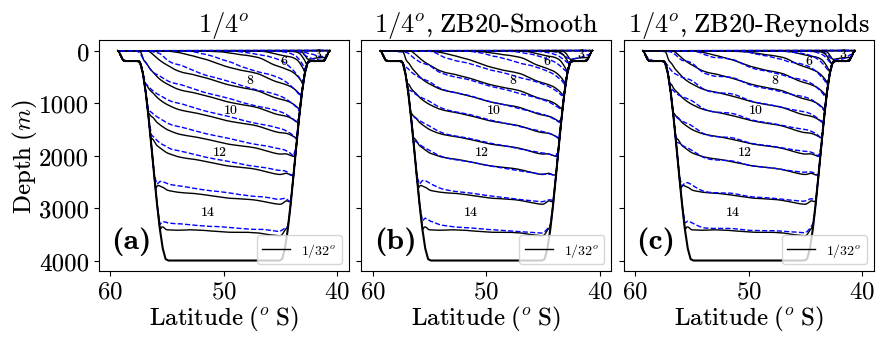

In [24]:
default_rcParams({'figure.subplot.wspace': 0.05, 'figure.subplot.hspace': 0.3, 'font.size': 18})
plt.figure(figsize=(10,3))
for col, (e, label) in enumerate(
    zip(
        [e4, e4_smooth, e4_reynolds], 
        ['$1/4^o$', '$1/4^o$, ZB20-Smooth', '$1/4^o$, ZB20-Reynolds']
        )
    ):
    plt.subplot(1,3,col+1)
    plot_interfaces_Drake(e)
    plt.title(label, fontsize=19)
    if col>0:
        plt.ylabel('')
        plt.yticks(np.arange(-4000,1000,1000), ['']*5)
    plt.plot(np.nan,np.nan,color='k', ls='-', lw=1, label='$1/32^o$')
    plt.legend(loc='lower right', fontsize=10)
        
#plt.plot(np.nan,np.nan,color='b', ls='--', label='Ocean model on a coarse grid')
#plt.plot(np.nan,np.nan,color='k', ls='-', label='$1/32^o$')
#plt.legend(ncol=2, bbox_to_anchor=(-0.55,-0.4), loc='center')
set_letters(fontsize=20, x=0.05,y=0.1)
plt.savefig('Paper-Figures/Drake-30k-20-new-code.pdf')

# Where APE was reduced?

In [3]:
R4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/snapshots_00041530.nc', decode_times=False)
R4_smooth = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-Scheme/Smooth-2.5-Klower/output/snapshots_00041030.nc', decode_times=False)
R4_reynolds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-Scheme/Reynolds-2.5-Klower/output/snapshots_00041030.nc', decode_times=False)
static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/static.nc', decode_times=False)

In [4]:
APE_R4 = APE_joul(R4.e, static, sum=False).sum('zi').mean('time').compute()

In [5]:
APE_smooth = APE_joul(R4_smooth.e, static, sum=False).sum('zi').mean('time').compute()

In [6]:
APE_reynolds = APE_joul(R4_reynolds.e, static, sum=False).sum('zi').mean('time').compute()

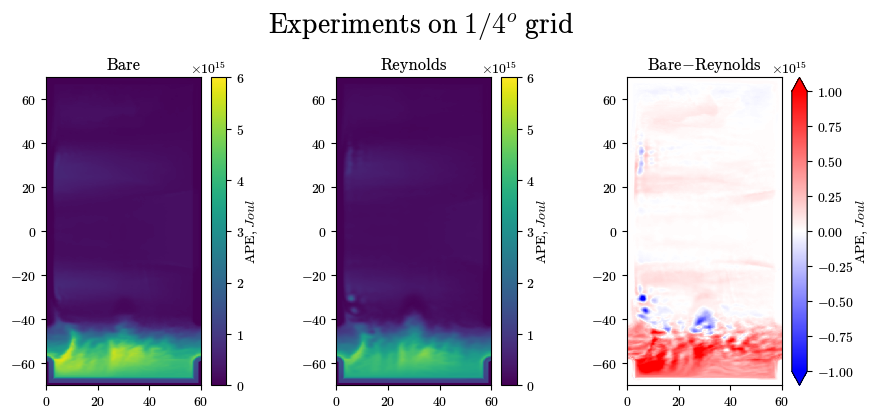

In [28]:
default_rcParams({'figure.subplot.wspace': 0.5, 'font.size':10})
plt.figure(figsize=(10,4))
plt.subplot(1,3,1)
APE_R4.plot.imshow(vmin=0, vmax=6e+15, cbar_kwargs={'label': 'APE, $Joul$'})
plt.xlabel(''); plt.ylabel('')
plt.title('Bare')
plt.subplot(1,3,2)
APE_reynolds.plot.imshow(vmin=0, vmax=6e+15, cbar_kwargs={'label': 'APE, $Joul$'})
plt.xlabel(''); plt.ylabel('')
plt.title('Reynolds')
plt.subplot(1,3,3)
(APE_R4-APE_reynolds).plot.imshow(vmin=-1e+15,vmax=1e+15,cmap='bwr', cbar_kwargs={'label': 'APE, $Joul$'})
plt.xlabel(''); plt.ylabel('')
plt.title('Bare$-$Reynolds')
plt.suptitle('Experiments on $1/4^o$ grid', y=1.05, fontsize=20)
plt.savefig('Where_APE_is_Reduced.pdf')

# Snapshot

In [25]:
R32f = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/1-degree-snapshots.nc', decode_times=False).isel(time=-1)
R4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/bare/output/snapshots_00029010.nc', decode_times=False).isel(time=-1)
R4_smooth = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Smooth-filter-3D/output/snapshots_00029010.nc', decode_times=False).isel(time=-1)
R4_reynolds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Reynolds-newest-code/output/snapshots_00029010.nc', decode_times=False).isel(time=-1)

In [26]:
R32f['h'] = e_to_h(R32f.e, R32f.h)

In [27]:
def KEz(ds):
    return 0.5 * (ds.h * (remesh(ds.u**2, ds.h) + remesh(ds.v**2, ds.h))).sum('zl')

subsample
Colorbar-like object skipped


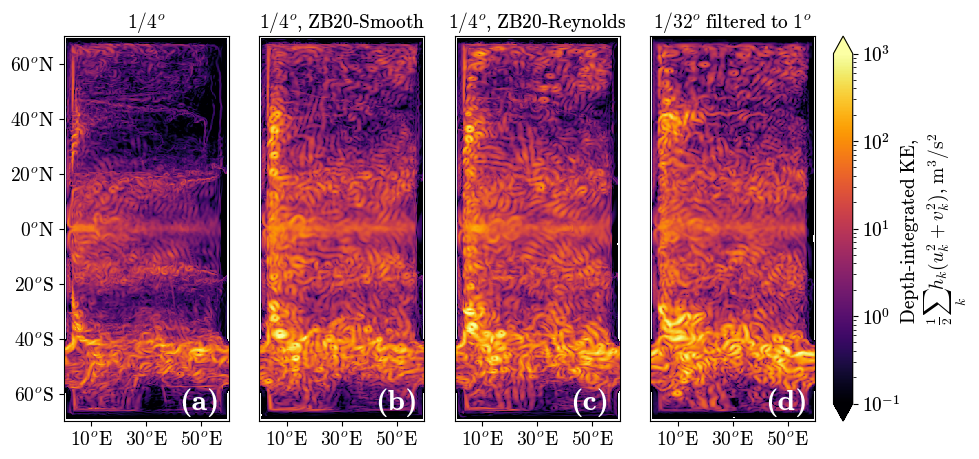

In [28]:
import matplotlib as mpl

default_rcParams({'figure.subplot.wspace': 0.05, 'figure.subplot.hspace': 0.3, 'font.size': 14})

plt.figure(figsize=(12,5))
for col, (exp, label) in enumerate(
    zip(
    [R4, R4_smooth, R4_reynolds, R32f],
    ['$1/4^o$', '$1/4^o$, ZB20-Smooth', '$1/4^o$, ZB20-Reynolds', '$1/32^o$ filtered to $1^o$']
    )):
    plt.subplot(1,4,col+1)
    KE = KEz(exp)
    if col==3:
        print('subsample')
        KE = KE.isel(xh=slice(None,None,8), yh=slice(None,None,8))
    im = KE.plot.imshow(
        norm=mpl.colors.LogNorm(vmin=1e-1, vmax=1e+3),
        cmap='inferno',
        add_colorbar=False,
        interpolation='none'
    )
    plt.gca().axes.set_aspect('equal')
    plt.xlabel('')
    plt.ylabel('')
    plt.title(label, fontsize=14)
    lons = [10,30,50]
    plt.xticks(lons, [f'${lon}^o$E' for lon in lons])
    if col==0:
        lats = [-60, -40, -20, 0, 20, 40, 60]
        lat_ticks = [f'${-lat}^o$S' if lat<0 else f'${lat}^o$N' for lat in lats]
        plt.yticks(lats, lat_ticks)
    else:
        plt.yticks([])
        
plt.colorbar(im, pad=0.02, ax=plt.gcf().axes, extend='both', label='Depth-integrated KE, \n$\\frac{1}{2} \\sum_k h_k (u_k^2 + v_k^2)$, $\mathrm{m}^3/\mathrm{s}^2$')
set_letters(x=0.7, y=0.03, fontsize=20, color='white')
plt.savefig('Paper-Figures/NW2_snapshot-filtered-30k-20-new-code.pdf')

subsample
Colorbar-like object skipped


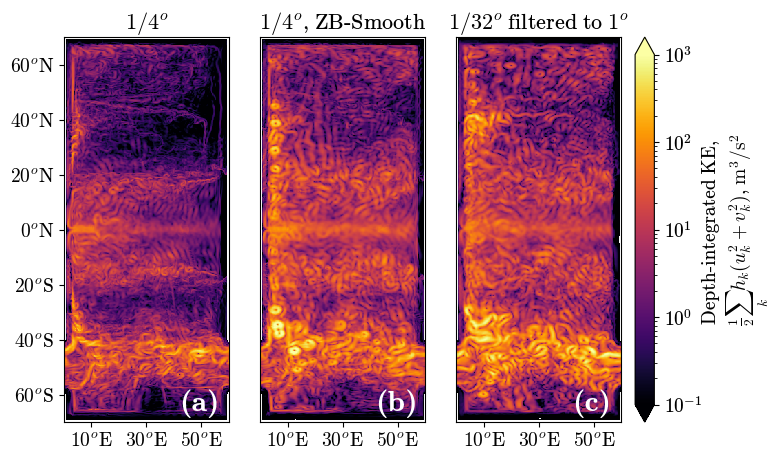

In [14]:
import matplotlib as mpl

default_rcParams({'figure.subplot.wspace': 0.05, 'figure.subplot.hspace': 0.3, 'font.size': 14})

plt.figure(figsize=(9,5))
for col, (exp, label) in enumerate(
    zip(
    [R4, R4_smooth, R32f],
    ['$1/4^o$', '$1/4^o$, ZB-Smooth', '$1/32^o$ filtered to $1^o$']
    )):
    plt.subplot(1,3,col+1)
    KE = KEz(exp)
    if col==2:
        print('subsample')
        KE = KE.isel(xh=slice(None,None,8), yh=slice(None,None,8))
    im = KE.plot.imshow(
        norm=mpl.colors.LogNorm(vmin=1e-1, vmax=1e+3),
        cmap='inferno',
        add_colorbar=False,
        interpolation='none'
    )
    plt.gca().axes.set_aspect('equal')
    plt.xlabel('')
    plt.ylabel('')
    plt.title(label, fontsize=16)
    lons = [10,30,50]
    plt.xticks(lons, [f'${lon}^o$E' for lon in lons])
    if col==0:
        lats = [-60, -40, -20, 0, 20, 40, 60]
        lat_ticks = [f'${-lat}^o$S' if lat<0 else f'${lat}^o$N' for lat in lats]
        plt.yticks(lats, lat_ticks)
    else:
        plt.yticks([])
        
plt.colorbar(im, pad=0.02, ax=plt.gcf().axes, extend='both', label='Depth-integrated KE, \n$\\frac{1}{2} \\sum_k h_k (u_k^2 + v_k^2)$, $\mathrm{m}^3/\mathrm{s}^2$')
set_letters(x=0.7, y=0.03, fontsize=20, color='white')
plt.savefig('Paper-Figures/NW2_snapshot-filtered-short-20.pdf')

# KE/APE

In [30]:
#stats_R4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/ocean.stats.merged.nc', decode_times=False)
#stats_smooth = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-Scheme/Smooth-2.5-Klower-dt/output/ocean.stats.merged.nc', decode_times=False)
#stats_reynolds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-Scheme/Reynolds-2.5-Klower-dt/output/ocean.stats.merged.nc', decode_times=False)

stats_R4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/bare/output/ocean.stats.nc', decode_times=False)
stats_smooth = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Smooth-filter-3D/output/ocean.stats.nc', decode_times=False)
stats_reynolds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Reynolds-newest-code/output/ocean.stats.nc', decode_times=False)

In [31]:
yellow = [0.9290, 0.6940, 0.1250]
violet = [0.4940, 0.1840, 0.5560]
lightblue = [0.3010, 0.7450, 0.9330]

In [32]:
def KE(ds):
    return ds.KE.sum('Layer')
def APE(ds):
    return ds.APE.sum('Interface')

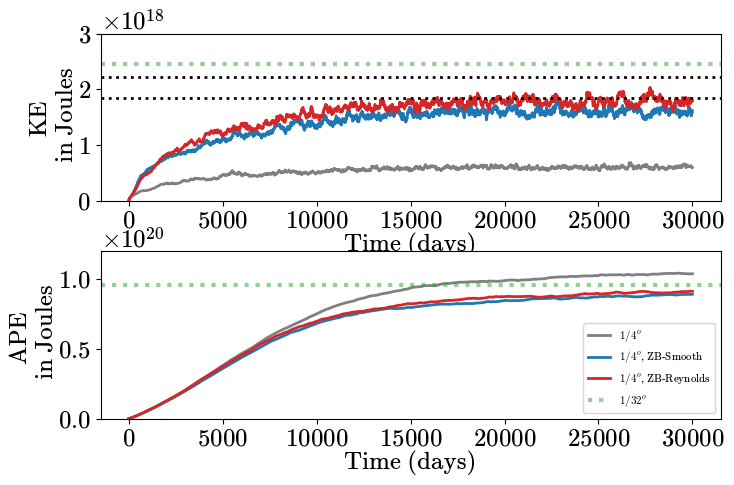

In [33]:
default_rcParams({'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.3, 'font.size': 18,  'axes.formatter.limits': (-5,5)})
plt.figure(figsize=(8,5))

plt.subplot(2,1,1)
KE(stats_R4).plot(color='gray', ls='-', label='$1/4^o$', lw=2)
KE(stats_smooth).plot(color='tab:blue', label='$1/4^o$, ZB-Smooth', lw=2)
KE(stats_reynolds).plot(color='tab:red', label='$1/4^o$, ZB-Reynolds', lw=2)

plt.axhline(y=2.4482846764501053e+18, color='tab:green', ls=':', lw=3, alpha=0.5)
plt.axhline(y=2.2143647793008573e+18, color='k', ls=':', lw=2)
plt.axhline(y=1.840343192972326e+18, color='k', ls=':', lw=2)
plt.ylabel('KE\n in Joules')
plt.ylim([0, 3e+18])
plt.xlabel('Time (days)')
#plt.xlim([32000, 42000])
#plt.xticks([32000, 37000, 42000])

plt.subplot(2,1,2)
APE(stats_R4).plot(color='gray', label='$1/4^o$', lw=2)
APE(stats_smooth).plot(color='tab:blue', label='$1/4^o$, ZB-Smooth', lw=2)
APE(stats_reynolds).plot(color='tab:red', label='$1/4^o$, ZB-Reynolds', lw=2)

plt.axhline(y=9.584091697350959e+19, color='tab:green', ls=':', lw=3, alpha=0.5, label='$1/32^o$')
#plt.axhline(y=8.890104828700493e+19, color='k', ls=':', lw=2, label='$1/32^o$ downscaled')
plt.ylabel('APE \n in Joules')
plt.ylim([0, 1.2e+20])
plt.xlabel('Time (days)')
plt.legend(loc = 'lower right', fontsize=8)
#plt.xlim([32000, 42000])
#plt.xticks([32000, 37000, 42000])
#set_letters(x=-0.2, y=1.1, fontsize=25)
#plt.savefig('Paper-Figures/NW2-time-series.pdf')

# Surface velocities

In [274]:
R4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4/bare/output/snapshots_00041530.nc', decode_times=False)
R32 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/R4_snapshots_FGR4.nc', decode_times=False)

In [275]:
def surf_u(ds):
    '''
    https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM.F90#L3624
    '''
    # This is a parameter of mixed layer for NW2_Hmix5 simulations
    depth_ml = 5.
    
    # We create two surface arrays
    SSU = ds.u.isel(zl=0) * 0
    depth = SSU
    
    hu = remesh(ds.h, ds.u)
    
    for k in range(len(ds.zl)):
        hu_layer = hu.isel(zl=k)
        cond1 = depth + hu_layer < depth_ml
        cond2 = depth < depth_ml
        
        # The third condition is automatically filled with zero because fillna
        dh = hu_layer.where(cond1).fillna(0) + (depth_ml-depth).where(cond2).fillna(0)
        
        SSU = SSU + dh * ds.u.isel(zl=k)
        depth = depth + dh
    
    SSU = SSU / depth
    return SSU

In [276]:
def surf_v(ds):
    '''
    https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM.F90#L3624
    '''
    # This is a parameter of mixed layer for NW2_Hmix5 simulations
    depth_ml = 5.
    
    # We create two surface arrays
    SSV = ds.v.isel(zl=0) * 0
    depth = SSV
    
    hv = remesh(ds.h, ds.v)
    
    for k in range(len(ds.zl)):
        hv_layer = hv.isel(zl=k)
        cond1 = depth + hv_layer < depth_ml
        cond2 = depth < depth_ml
        
        # The third condition is automatically filled with zero because fillna
        dh = hv_layer.where(cond1).fillna(0) + (depth_ml-depth).where(cond2).fillna(0)
        
        SSV = SSV + dh * ds.v.isel(zl=k)
        depth = depth + dh
    
    SSV = SSV / depth
    return SSV

In [277]:
ssu = surf_u(R32)
ssv = surf_v(R32)

In [278]:
ssu.hvplot(x='xq', y='yh', width=300, height=600, cmap='bwr', clim=(-1,1)) + \
R32.u.hvplot(x='xq', y='yh', width=300, height=600, cmap='bwr', clim=(-1,1))

:Layout
   .DynamicMap.I  :DynamicMap   [time]
      :Image   [xq,yh]   (value)
   .DynamicMap.II :DynamicMap   [zl,time]
      :Image   [xq,yh]   (u)

In [279]:
ssv.hvplot(x='xh', y='yq', width=300, height=600, cmap='bwr', clim=(-1,1)) + \
R32.v.hvplot(x='xh', y='yq', width=300, height=600, cmap='bwr', clim=(-1,1))

:Layout
   .DynamicMap.I  :DynamicMap   [time]
      :Image   [xh,yq]   (value)
   .DynamicMap.II :DynamicMap   [zl,time]
      :Image   [xh,yq]   (v)

# KE spectrum of surface velocities

In [35]:
R4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/bare/output/snapshots_00029010.nc', decode_times=False).isel(time=slice(-4,None))
R4_smooth = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Smooth-filter-3D/output/snapshots_00029010.nc', decode_times=False).isel(time=slice(-4,None))
R4_reynolds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Reynolds-newest-code/output/snapshots_00029010.nc', decode_times=False).isel(time=slice(-4,None))

R32f_R1 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/1-degree-snapshots.nc', decode_times=False)
R32f_R2 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/0.5-degree-snapshots.nc', decode_times=False)
R32 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/snapshots*.nc', decode_times=False).isel(time=slice(None,None,6))

In [34]:
M4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/bare/output/longmean_00029050.nc', decode_times=False)
M4_smooth = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Smooth-filter-3D/output/longmean_00029050.nc', decode_times=False)
M4_reynolds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Reynolds-newest-code/output/longmean_00029050.nc', decode_times=False)

M32f_R1 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/1-degree-longmean.nc', decode_times=False)
M32f_R2 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/0.5-degree-longmean.nc', decode_times=False)
M32 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/longmean*.nc', decode_times=False)

In [36]:
import xrft
def KE_spectrum(u, v, dx_mean=1):    
    x = dx_mean*np.arange(len(u.xh))
    u['xh'] = x
    v['xh'] = x
    
    spec = lambda val: xrft.power_spectrum(val, dim='xh', window='hann', nfactor=2,truncate=True, detrend='linear', window_correction=False)
    
    # KE is half the power spectrum
    sp = (spec(u) + spec(v))/2
    
    # Normalize to angular frequencies
    sp['freq_xh'] = sp['freq_xh'] * 2 * np.pi
    sp = sp / (2 * np.pi)
    freq = sp.freq_xh
    sp = sp.where(freq>0)
    
    return sp.mean('time').compute()

In [37]:
def SKE_spectrum(ds, ds_mean):
    ssu = ds.u.isel(zl=0) - ds_mean.u.isel(zl=0).mean('time')
    ssv = ds.v.isel(zl=0) - ds_mean.v.isel(zl=0).mean('time')
    
    ssu = remesh(ssu, ds.h)
    ssv = remesh(ssv, ds.h)
    
    # remove 2.5 Lon from boundaries similarly to Marques
#     ssu = ssu.sel(xh = slice(2.5, 57.5))
#     ssv = ssv.sel(xh = slice(2.5, 57.5))
    
    if len(ds.xh)==240:
        dx_mean = 21383.6332011
    elif len(ds.xh)==1920:
        dx_mean = 21383.6332011 / 8
    else:
        print('Define dx_mean')
    
    return KE_spectrum(ssu,ssv,dx_mean)

In [38]:
from dask.diagnostics import ProgressBar

In [39]:
with ProgressBar():
    R32_spec = SKE_spectrum(R32,M32)
    R32f_R1_spec = SKE_spectrum(R32f_R1,M32f_R1)
    R32f_R2_spec = SKE_spectrum(R32f_R2,M32f_R2)
    R4_spec = SKE_spectrum(R4,M4)
    smooth_spec = SKE_spectrum(R4_smooth,M4_smooth)
    reynolds_spec = SKE_spectrum(R4_reynolds,M4_reynolds)

[########################################] | 100% Completed | 25.89 ss
[########################################] | 100% Completed | 7.07 sms
[########################################] | 100% Completed | 7.25 sms
[########################################] | 100% Completed | 1.31 sms
[########################################] | 100% Completed | 1.32 sms
[########################################] | 100% Completed | 1.31 sms


(0.0001, 10000.0)

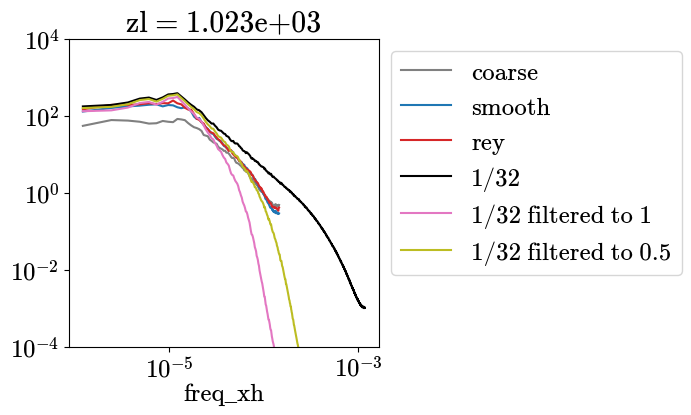

In [40]:
sel = lambda x : x.sel(yh=slice(None,None)).mean('yh')
sel(R4_spec).plot(color='gray', label='coarse')
sel(smooth_spec).plot(color='tab:blue', label='smooth')
sel(reynolds_spec).plot(color='tab:red', label='rey')
sel(R32_spec).plot(color='k', label='1/32')
sel(R32f_R1_spec).plot(color='tab:pink', label='1/32 filtered to 1')
sel(R32f_R2_spec).plot(color='tab:olive', label='1/32 filtered to 0.5')
plt.yscale('log')
plt.xscale('log')
plt.legend(bbox_to_anchor=(1,1))
plt.ylim([1e-4,1e+4])

## Combined figure

In [41]:
stats_R4 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/bare/output/ocean.stats.nc', decode_times=False).coarsen({'Time':50}, boundary='trim').mean()
stats_smooth = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Smooth-filter-3D/output/ocean.stats.nc', decode_times=False).coarsen({'Time':50}, boundary='trim').mean()
stats_reynolds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/Reynolds-newest-code/output/ocean.stats.nc', decode_times=False).coarsen({'Time':50}, boundary='trim').mean()

In [200]:
stats_R4.Time[1]-stats_R4.Time[0]

<xarray.DataArray 'Time' ()>
array(250.)

In [42]:
def KE(ds):
    return ds.KE.sum('Layer')
def APE(ds):
    return ds.APE.sum('Interface')

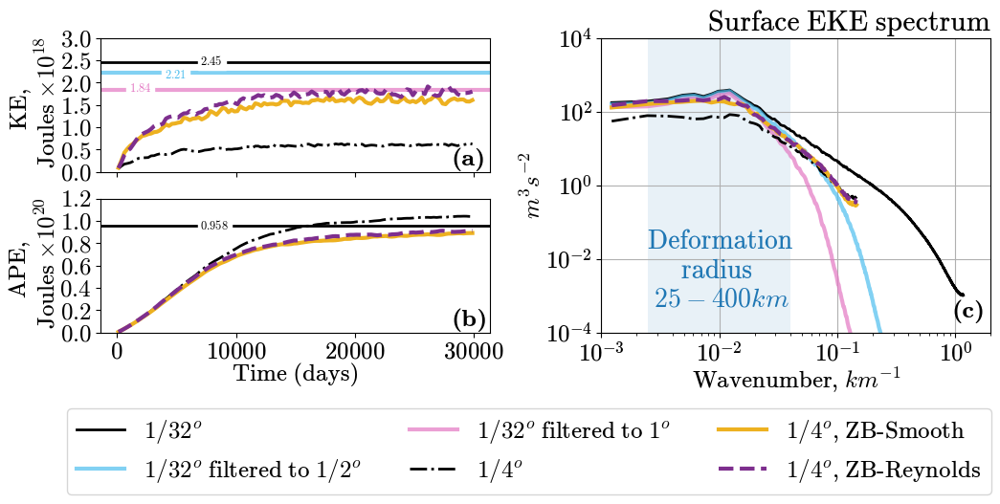

In [43]:
default_rcParams({'figure.subplot.wspace': 0.8, 'figure.subplot.hspace': 0.2,
                  'font.size': 18,  'axes.formatter.limits': (-5,5),
                 })
fig = plt.figure(figsize=(12,4))
import matplotlib.colors as mcolors

gs = fig.add_gridspec(2,4)

plt.sca(fig.add_subplot(gs[0, 0:2]))

plt.axhline(y=2.4482846764501053e+18, color='k', ls='-', lw=2, zorder=-1, label='$1/32^o$')
plt.axhline(y=2.2143647793008573e+18, color=lightblue, ls='-', lw=3, alpha=0.7, zorder=-1, label='$1/32^o$ filtered to $1/2^o$')
plt.axhline(y=1.840343192972326e+18, color='tab:pink', ls='-', lw=3, alpha=0.7, zorder=-1, label='$1/32^o$ filtered to $1^o$')

plt.text(7000,2.4e+18,'$2.45$', backgroundcolor='white', color='k', fontsize=9)
plt.text(4000,2.1e+18,'$2.21$', backgroundcolor='white', color=lightblue, fontsize=9)
plt.text(1000,1.8e+18,'$1.84$', backgroundcolor='white', color='tab:pink', fontsize=9)


KE(stats_R4).plot(color='k', ls='-.', label='$1/4^o$', lw=2)
KE(stats_smooth).plot(color=yellow, label='$1/4^o$, ZB-Smooth', lw=3)
KE(stats_reynolds).plot(color=violet, label='$1/4^o$, ZB-Reynolds', lw=3, ls='--')


plt.ylabel('KE, \n Joules $\\times 10^{18}$')
plt.ylim([0, 3e+18])
plt.yticks([0, 0.5e+18,1e+18,1.5e+18,2.0e+18,2.5e+18,3e+18], ['$0.0$', '$0.5$', '$1.0$', '$1.5$', '$2.0$', '$2.5$', '$3.0$'])
#plt.yticks([0, 0.6e+18,1.2e+18,1.8e+18,2.4e+18,3.0e+18], ['$0.0$', '$0.6$', '$1.2$', '$1.8$', '$2.4$', '$3.0$'])
plt.xlabel('')
plt.xticks([0, 10000, 20000, 30000], [None]*4)
#plt.grid()

plt.legend(loc = 'lower center', fontsize=18, bbox_to_anchor=(1.1,-2.5), ncol=3)

plt.sca(fig.add_subplot(gs[1, 0:2]))
plt.axhline(y=9.584091697350959e+19, color='k', ls='-', lw=2)
plt.text(7000,9.25e+19,'$0.958$', backgroundcolor='white', color='k', fontsize=9)


APE(stats_R4).plot(color='k', label='$1/4^o$', lw=2, ls='-.')
APE(stats_smooth).plot(color=yellow, label='$1/4^o$, ZB-Smooth', lw=3)
APE(stats_reynolds).plot(color=violet, label='$1/4^o$, ZB-Reynolds', lw=3, ls='--')

plt.ylabel('APE, \n Joules $\\times 10^{20}$')
#plt.title('APE',loc='right')
plt.ylim([0, 1.2e+20])
#plt.grid()

plt.yticks([0, 0.2e+20, 0.4e+20, 0.6e+20, 0.8e+20, 1.0e+20, 1.2e+20], ["$0.0$", "$0.2$", "$0.4$", "$0.6$", "$0.8$", "$1.0$", "$1.2$"])
#plt.yticks([0, 0.3e+20, 0.6e+20, 0.9e+20, 1.2e+20], ["$0.0$", "$0.3$", "$0.6$", "$0.9$", "$1.2$"])

plt.xlabel('Time (days)')


plt.sca(fig.add_subplot(gs[0:2, 2:4]))
def sel(x):
    y = x.sel(yh=slice(None,None)).mean('yh')
    y['freq_xh'] = y['freq_xh'] * 1e+3
    return y
sel(R32_spec).plot(color='k', ls='-', lw=2)
sel(R32f_R2_spec).plot(color=lightblue, ls='-', lw=3, alpha=0.7)
sel(R32f_R1_spec).plot(color='tab:pink', ls='-', lw=3, alpha=0.7)

sel(R4_spec).plot(color='k', lw=2, ls='-.')
sel(smooth_spec).plot(color=yellow, lw=3)
sel(reynolds_spec).plot(color=violet, lw=3, ls='--')
plt.xscale('log')
plt.yscale('log')
plt.ylim([1e-4,1e+4])
plt.yticks([1e-4, 1e-2, 1e0, 1e+2, 1e+4])
plt.title('Surface EKE spectrum', loc='right')
plt.title('')
plt.ylabel('$m^3s^{-2}$')
plt.xlabel('Wavenumber, $km^{-1}$')
plt.xticks([1e-3, 1e-2, 1e-1, 1e0])
plt.xlim([1e-3, 2])
plt.grid()

Rd1 = 400
Rd2 = 25
plt.axvspan(1/Rd1, 1/Rd2, color='tab:blue', alpha=0.1, lw=0)
plt.text(2.5e-3,5e-4,'Deformation \n     radius \n $25-400km$', fontsize=20, color='tab:blue')


# k = np.array([1e-2,1e0])
# plt.plot(k, 3e-1*k**(-2))

#plt.gcf().align_labels()
set_letters(x=0.9, y=0.05, fontsize=18)
#plt.savefig('Paper-Figures/NW2-time-series-spectrum-filtered-30k.pdf')

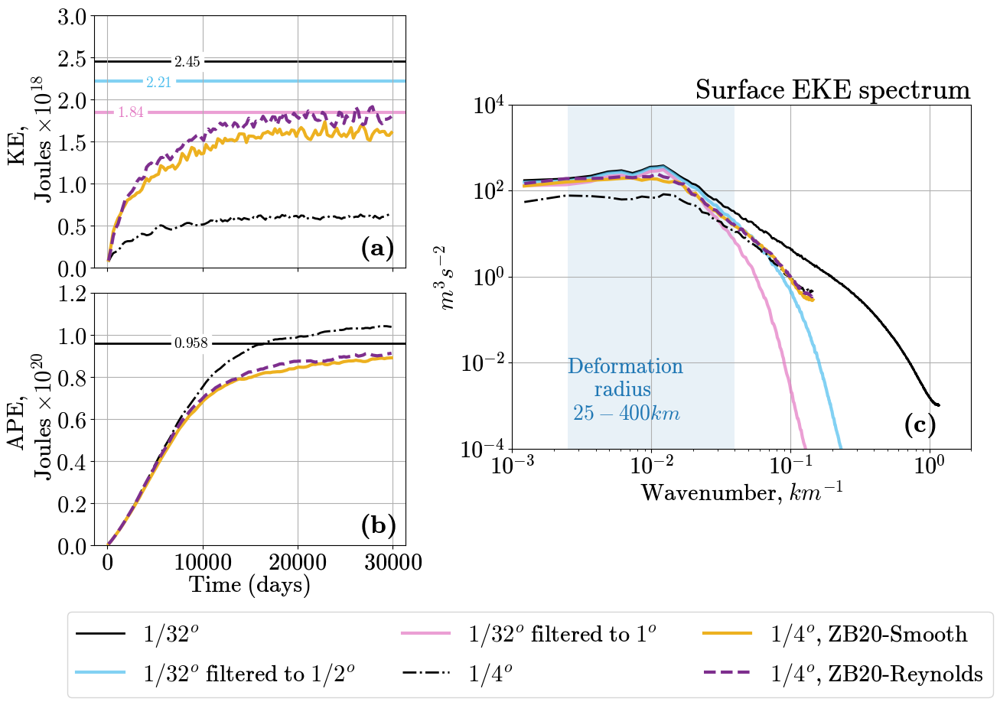

In [44]:
default_rcParams({'figure.subplot.wspace': 0.8, 'figure.subplot.hspace': 0.1,
                  'font.size': 22,  'axes.formatter.limits': (-5,5),
                 })
fig = plt.figure(figsize=(12,9))
import matplotlib.colors as mcolors

gs = fig.add_gridspec(2,4)

plt.sca(fig.add_subplot(gs[0, 0:2]))

plt.axhline(y=2.4482846764501053e+18, color='k', ls='-', lw=2, zorder=-1, label='$1/32^o$')
plt.axhline(y=2.2143647793008573e+18, color=lightblue, ls='-', lw=3, alpha=0.7, zorder=-1, label='$1/32^o$ filtered to $1/2^o$')
plt.axhline(y=1.840343192972326e+18, color='tab:pink', ls='-', lw=3, alpha=0.7, zorder=-1, label='$1/32^o$ filtered to $1^o$')

plt.text(7000,2.4e+18,'$2.45$', backgroundcolor='white', color='k', fontsize=14)
plt.text(4000,2.15e+18,'$2.21$', backgroundcolor='white', color=lightblue, fontsize=14)
plt.text(1000,1.8e+18,'$1.84$', backgroundcolor='white', color='tab:pink', fontsize=14)


KE(stats_R4).plot(color='k', ls='-.', label='$1/4^o$', lw=2)
KE(stats_smooth).plot(color=yellow, label='$1/4^o$, ZB20-Smooth', lw=3)
KE(stats_reynolds).plot(color=violet, label='$1/4^o$, ZB20-Reynolds', lw=3, ls='--')


plt.ylabel('KE, \n Joules $\\times 10^{18}$')
plt.ylim([0, 3e+18])
plt.yticks([0, 0.5e+18,1e+18,1.5e+18,2.0e+18,2.5e+18,3e+18], ['$0.0$', '$0.5$', '$1.0$', '$1.5$', '$2.0$', '$2.5$', '$3.0$'])
#plt.yticks([0, 0.6e+18,1.2e+18,1.8e+18,2.4e+18,3.0e+18], ['$0.0$', '$0.6$', '$1.2$', '$1.8$', '$2.4$', '$3.0$'])
plt.xlabel('')
plt.xticks([0, 10000, 20000, 30000], [None]*4)
plt.grid()

plt.legend(loc = 'lower center', fontsize=22, bbox_to_anchor=(1.4,-1.75), ncol=3)

plt.sca(fig.add_subplot(gs[1, 0:2]))
plt.axhline(y=9.584091697350959e+19, color='k', ls='-', lw=2)
plt.text(7000,9.4e+19,'$0.958$', backgroundcolor='white', color='k', fontsize=14)


APE(stats_R4).plot(color='k', label='$1/4^o$', lw=2, ls='-.')
APE(stats_smooth).plot(color=yellow, label='$1/4^o$, ZB-Smooth', lw=3)
APE(stats_reynolds).plot(color=violet, label='$1/4^o$, ZB-Reynolds', lw=3, ls='--')

plt.ylabel('APE, \n Joules $\\times 10^{20}$')
#plt.title('APE',loc='right')
plt.ylim([0, 1.2e+20])
plt.grid()

plt.yticks([0, 0.2e+20, 0.4e+20, 0.6e+20, 0.8e+20, 1.0e+20, 1.2e+20], ["$0.0$", "$0.2$", "$0.4$", "$0.6$", "$0.8$", "$1.0$", "$1.2$"])
#plt.yticks([0, 0.3e+20, 0.6e+20, 0.9e+20, 1.2e+20], ["$0.0$", "$0.3$", "$0.6$", "$0.9$", "$1.2$"])

plt.xlabel('Time (days)')


#plt.sca(fig.add_subplot(gs[0:2, 2:4]))
ax = plt.gcf().add_axes([0.58, 0.25, 0.5,0.5])
plt.sca(ax)
def sel(x):
    y = x.sel(yh=slice(None,None)).mean('yh')
    y['freq_xh'] = y['freq_xh'] * 1e+3
    return y
sel(R32_spec).plot(color='k', ls='-', lw=2)
sel(R32f_R2_spec).plot(color=lightblue, ls='-', lw=3, alpha=0.7)
sel(R32f_R1_spec).plot(color='tab:pink', ls='-', lw=3, alpha=0.7)

sel(R4_spec).plot(color='k', lw=2, ls='-.')
sel(smooth_spec).plot(color=yellow, lw=3)
sel(reynolds_spec).plot(color=violet, lw=3, ls='--')
plt.xscale('log')
plt.yscale('log')
plt.ylim([1e-4,1e+4])
plt.yticks([1e-4, 1e-2, 1e0, 1e+2, 1e+4])
plt.title('Surface EKE spectrum', loc='right')
plt.title('')
plt.ylabel('$m^3s^{-2}$')
plt.xlabel('Wavenumber, $km^{-1}$')
plt.xticks([1e-3, 1e-2, 1e-1, 1e0])
plt.xlim([1e-3, 2])
plt.grid()

Rd1 = 400
Rd2 = 25
plt.axvspan(1/Rd1, 1/Rd2, color='tab:blue', alpha=0.1, lw=0)
plt.text(2.5e-3,5e-4,'Deformation \n     radius \n $25-400km$', fontsize=20, color='tab:blue')


# k = np.array([1e-2,1e0])
# plt.plot(k, 3e-1*k**(-2))

#plt.gcf().align_labels()
set_letters(x=0.85, y=0.05, fontsize=24)
plt.savefig('Paper-Figures/NW2-time-series-spectrum-filtered-30k-layout-20-new-code.pdf')

# Compare old and new code

In [82]:
def get_key(exp, key='KE'):
    ds = xr.open_dataset(f'/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/{exp}/output/ocean.stats.nc', decode_times=False)
    if key=='KE':
        return ds.KE.sum('Layer')
    elif key=='APE':
        return ds.APE.sum('Interface')
    elif key=='CFL':
        return ds.max_CFL_lin
    else:
        return ds

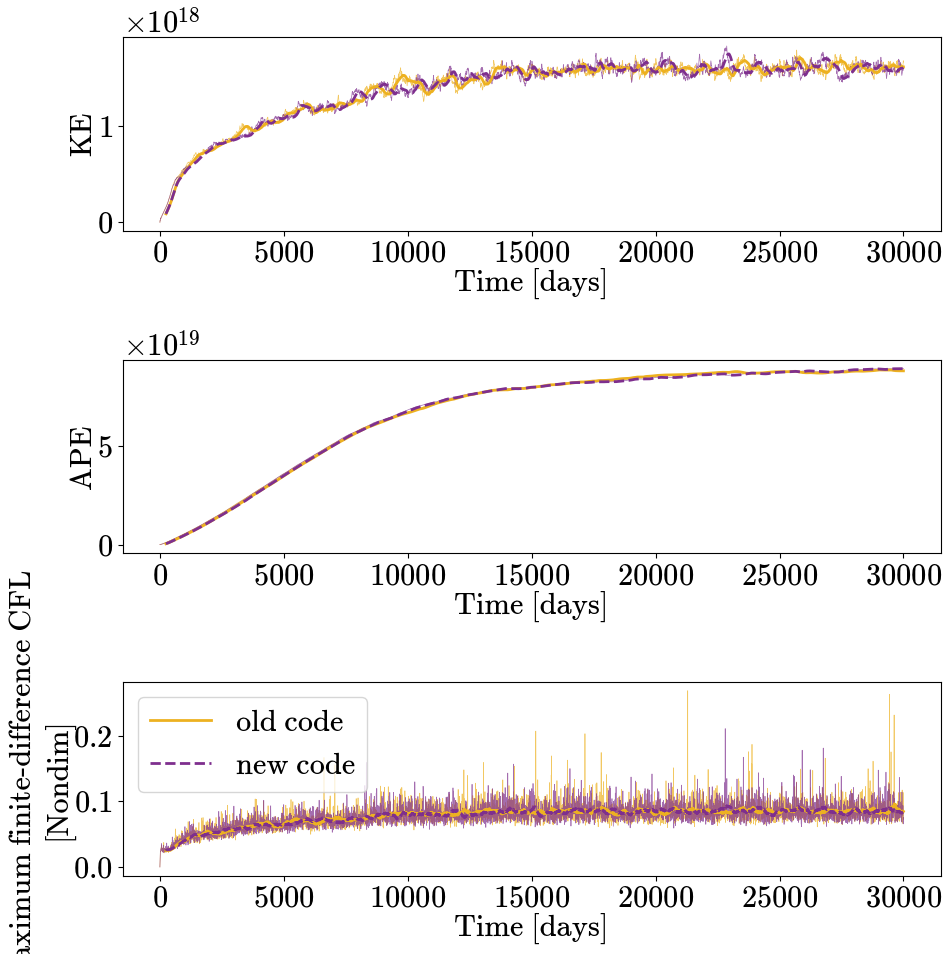

In [86]:
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
get_key('Smooth', 'KE').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5, color=yellow)
get_key('Smooth-filter-3D', 'KE').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5,color=violet)
get_key('Smooth', 'KE').rolling(Time=50).mean().plot(lw=2, color=yellow)
get_key('Smooth-filter-3D', 'KE').rolling(Time=50).mean().plot(lw=2,color=violet, ls='--')

plt.subplot(3,1,2)
get_key('Smooth', 'APE').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5, color=yellow)
get_key('Smooth-filter-3D', 'APE').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5,color=violet)
get_key('Smooth', 'APE').rolling(Time=50).mean().plot(lw=2, color=yellow)
get_key('Smooth-filter-3D', 'APE').rolling(Time=50).mean().plot(lw=2,color=violet, ls='--')

plt.subplot(3,1,3)
get_key('Smooth', 'CFL').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5, color=yellow)
get_key('Smooth-filter-3D', 'CFL').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5,color=violet)
get_key('Smooth', 'CFL').rolling(Time=50).mean().plot(lw=2, color=yellow, label='old code')
get_key('Smooth-filter-3D', 'CFL').rolling(Time=50).mean().plot(lw=2,color=violet, ls='--', label='new code')
plt.legend()
plt.tight_layout()

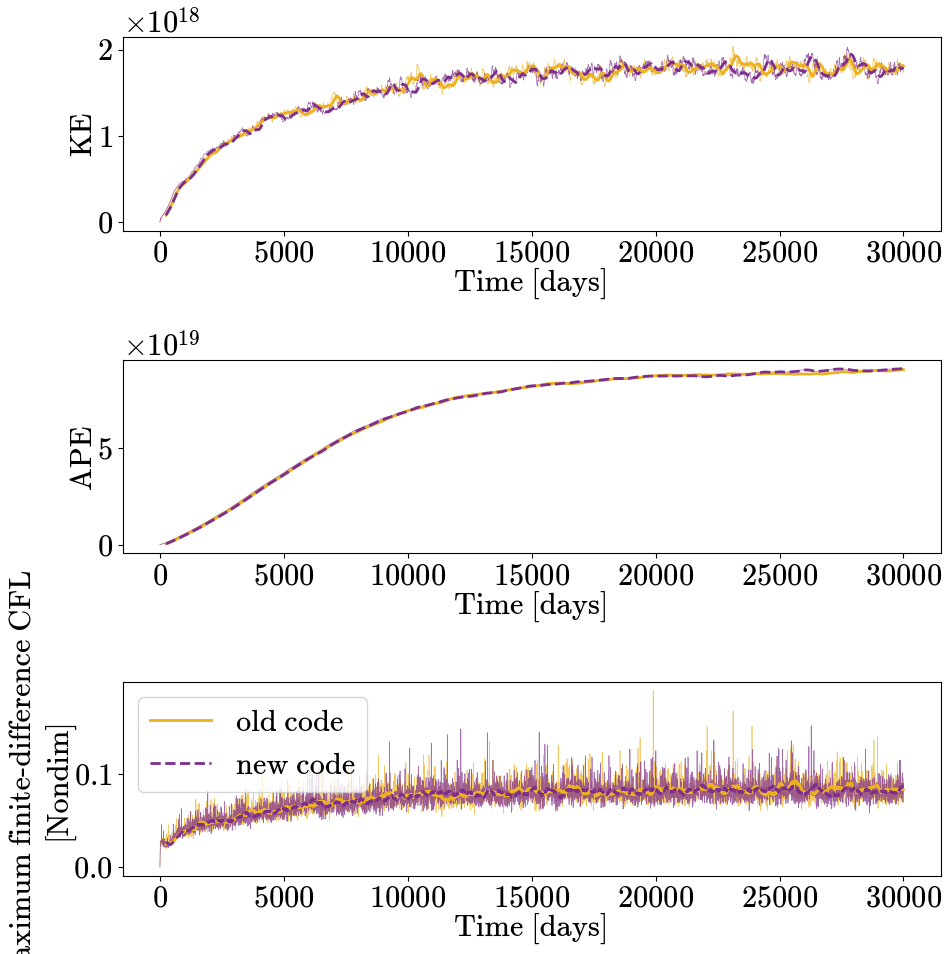

In [87]:
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
get_key('Reynolds', 'KE').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5, color=yellow)
get_key('Reynolds-newest-code', 'KE').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5,color=violet)
get_key('Reynolds', 'KE').rolling(Time=50).mean().plot(lw=2, color=yellow)
get_key('Reynolds-newest-code', 'KE').rolling(Time=50).mean().plot(lw=2,color=violet, ls='--')

plt.subplot(3,1,2)
get_key('Reynolds', 'APE').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5, color=yellow)
get_key('Reynolds-newest-code', 'APE').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5,color=violet)
get_key('Reynolds', 'APE').rolling(Time=50).mean().plot(lw=2, color=yellow)
get_key('Reynolds-newest-code', 'APE').rolling(Time=50).mean().plot(lw=2,color=violet, ls='--')

plt.subplot(3,1,3)
get_key('Reynolds', 'CFL').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5, color=yellow)
get_key('Reynolds-newest-code', 'CFL').rolling(Time=1).mean().plot(alpha=0.7,lw=0.5,color=violet)
get_key('Reynolds', 'CFL').rolling(Time=50).mean().plot(lw=2, color=yellow, label='old code')
get_key('Reynolds-newest-code', 'CFL').rolling(Time=50).mean().plot(lw=2,color=violet, ls='--', label='new code')
plt.legend()
plt.tight_layout()